# <a>Unsupervised Learning Project</a>
## <a>"Corgie" Model Vehicles Classification <a>
by Sandesh Balyan

<div class="list-group" id="list-tab" role="tablist">
  <h3 class="list-group-item list-group-item-action active" data-toggle="list"  role="tab" aria-controls="home">Table of Contents</h3>
  <a class="list-group-item list-group-item-action" data-toggle="list" href="#dp" role="tab" aria-controls="profile">Exploratory Data Analysis and Preprocessing<span class="badge badge-primary badge-pill">1</span></a>    
  <a class="list-group-item list-group-item-action" data-toggle="list" href="#data" role="tab" aria-controls="messages">Understanding and Finalisation of Attributes<span class="badge badge-primary badge-pill">2</span></a>    
  <a class="list-group-item list-group-item-action"  data-toggle="list" href="#split" role="tab" aria-controls="settings">Splitting Dataset in Train and Test<span class="badge badge-primary badge-pill">3</span></a>    
  <a class="list-group-item list-group-item-action" data-toggle="list" href="#simplesvm" role="tab" aria-controls="settings">Building Basic SVM Classifier<span class="badge badge-primary badge-pill">4</span></a>   
  <a class="list-group-item list-group-item-action" data-toggle="list" href="#svmcv" role="tab" aria-controls="settings">SVM Cross Validation<span class="badge badge-primary badge-pill">5</span></a>     
  <a class="list-group-item list-group-item-action" data-toggle="list" href="#pca" role="tab" aria-controls="settings">Principal Component Analysis<span class="badge badge-primary badge-pill">6</span></a>
  <a class="list-group-item list-group-item-action" data-toggle="list" href="#modeleval" role="tab" aria-controls="settings">Model Comparison and Conclusion<span class="badge badge-primary badge-pill">7</span></a>

## <a>Description <a>
The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars.

## <a>Objective<a>
##### Apply dimensionality reduction technique – PCA and train a model using principle components instead of training the model using just the raw data.
    
We will build an SVM model by eliminating features manually and then using PCA and compare the accuracy scores for these models

# <a id='dp'>1. Exploratory Data Analysis and Preprocessing<a>

##  1.1 Loading Data

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import itertools
import time
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [2]:
data=pd.read_csv('vehicle-1.csv')
data.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [3]:
data.shape

(846, 19)

There are total 846 rows and 19 attributes(including dependent variable) in the dataset

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

1. All the data types are of numeric types and no action needed to handle any of them
2. There are few null value in some variables

## 1.1.1 Handling null in dataset

In [5]:
data.isnull().sum()


compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

#### Dropping null values

In [6]:
tempData = data.copy()
data = data.dropna()

## 1.1.2 Checking distribution of observations in each class 

In [7]:
data.groupby('class').count()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
class,,,,,,,,,,,,,,,,,,
bus,205,205,205,205,205,205,205,205,205,205,205,205,205,205,205,205,205,205
car,413,413,413,413,413,413,413,413,413,413,413,413,413,413,413,413,413,413
van,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195,195


1. Highest number of observations are for car, probably because it contains two different categories of cars (Saab 9000 and Opel Manta 400)
2. buses and vans have nearly the same share.

## 1.1.3 Checking duplicates in dataset 

In [8]:
data.duplicated().value_counts()

False    813
dtype: int64

There are no duplicates in this data

## 1.2 Exploratory Data Analysis

### 1.2.1 Distribution of numerical variables

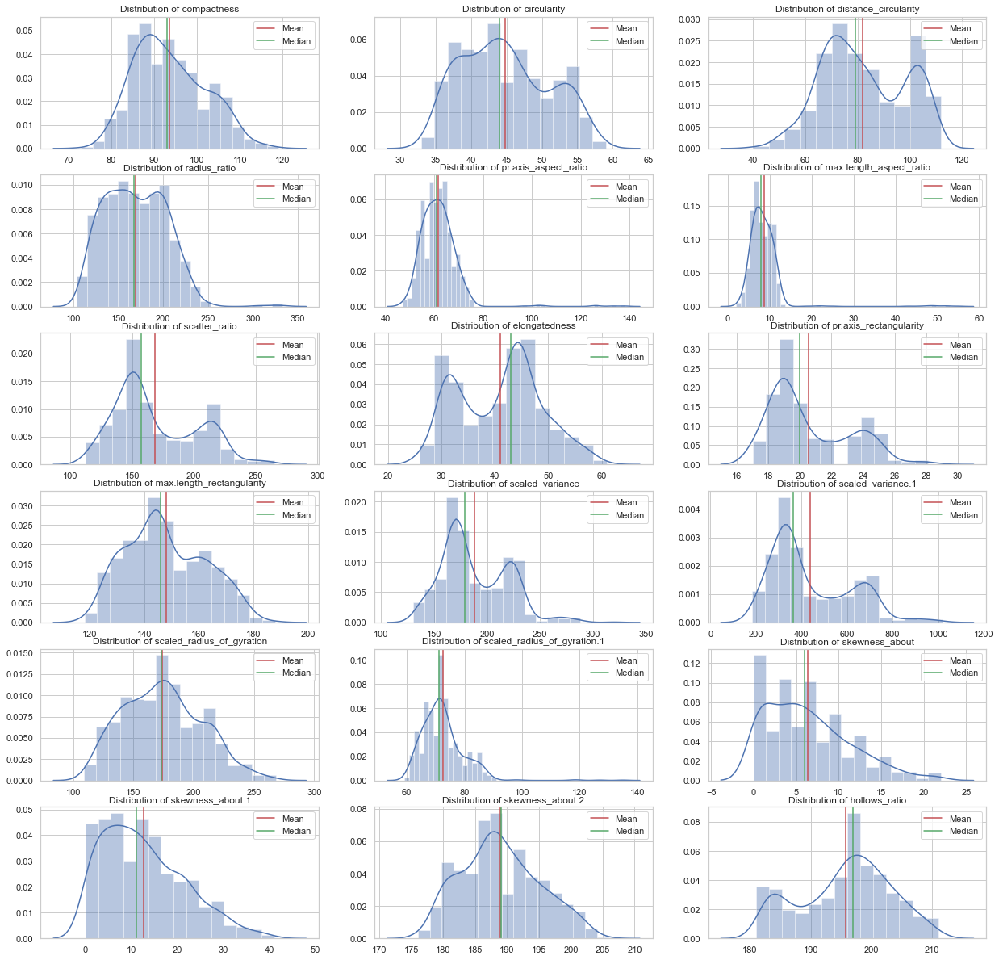

In [9]:
ncol = 3
nrow = len(data.columns[:-1]) / ncol

fig = plt.figure(1,figsize=(21,21))
for i,col in enumerate(data.columns[:-1]):
    sns.set(style = 'whitegrid')
    ax=plt.subplot(nrow,ncol,i+1)
    sns.distplot(data[col])
    ax.set_title('Distribution of '+col)
    ax.set_xlabel(None)
    ax.axvline(data[col].mean(),c='r',label='Mean')
    ax.axvline(data[col].median(),c='g',label='Median')
    ax.legend(loc="upper right")


##### Insights:
1. Median and mean values are same or nearby in majority of the attributes
2. Most of the variables depict atleast 2 peaks indicating presence of atleast 2 clusters i.e. atleast 2 normalised curves
3. In some cases example skewness_about, skewness_about1, radious ratio, pr axis aspect ratio, max length aspect ratio, data is right skewed and indicated presence of outliers. 

   ### 1.2.2 Five Points Summary and Outliers 

In [10]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
compactness,813.0,93.656827,8.233751,73.0,87.0,93.0,100.0,119.0
circularity,813.0,44.803198,6.146659,33.0,40.0,44.0,49.0,59.0
distance_circularity,813.0,82.043050,15.783070,40.0,70.0,79.0,98.0,112.0
radius_ratio,813.0,169.098401,33.615402,104.0,141.0,167.0,195.0,333.0
pr.axis_aspect_ratio,813.0,61.774908,7.973000,47.0,57.0,61.0,65.0,138.0
max.length_aspect_ratio,813.0,8.599016,4.677174,2.0,7.0,8.0,10.0,55.0
scatter_ratio,813.0,168.563346,33.082186,112.0,146.0,157.0,198.0,265.0
elongatedness,813.0,40.988930,7.803380,26.0,33.0,43.0,46.0,61.0
pr.axis_rectangularity,813.0,20.558426,2.573184,17.0,19.0,20.0,23.0,29.0
max.length_rectangularity,813.0,147.891759,14.504648,118.0,137.0,146.0,159.0,188.0


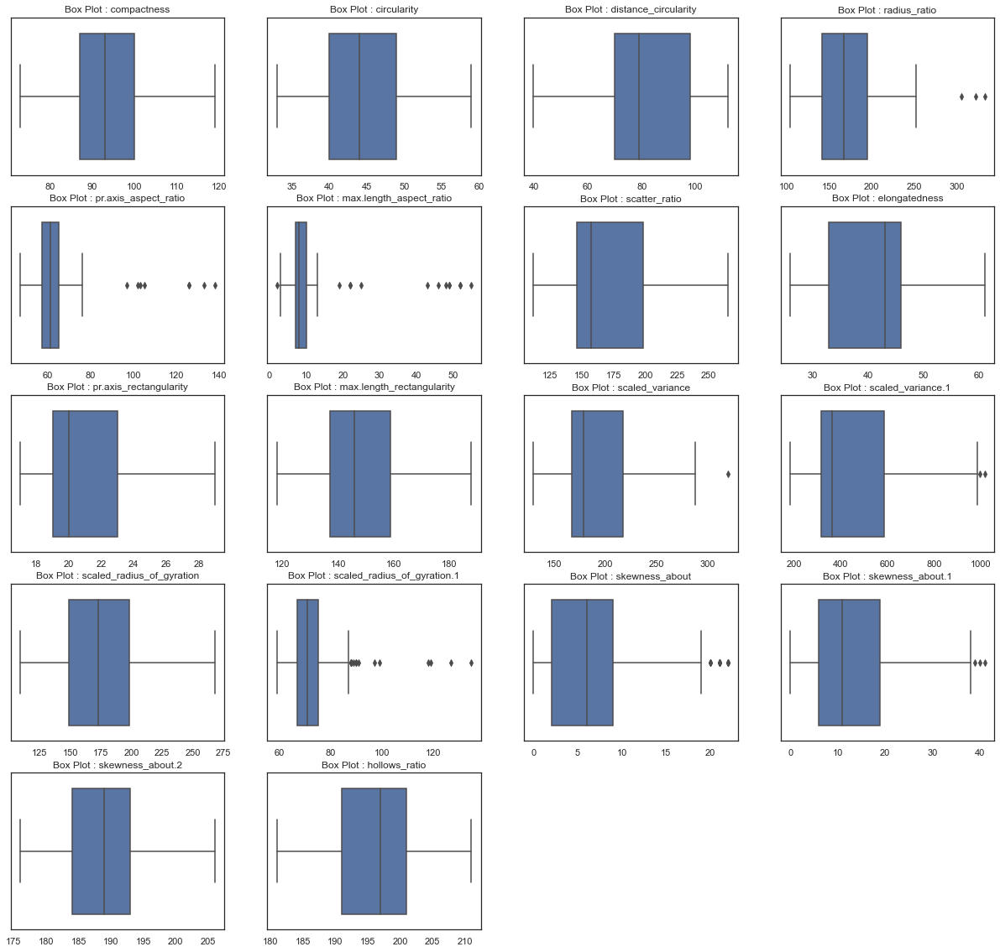

In [11]:
fig = plt.figure(1,figsize=(21,20))
ncol = 4
nrow = np.ceil(len(data.columns[:-1]) / ncol) 

for i,col in enumerate(data.columns[:-1]):
    sns.set(style='white')
    ax=plt.subplot(nrow,ncol,i+1)
    sns.boxplot(data[col])
    ax.set_title('Box Plot : '+col)
    ax.set_xlabel(None)

##### Insights:
1. There are outliers in some of the variables viz. 'scaled_radius_of_gyration_1', 'scaled_variance', 'scaled_variance1', 'skewness_about', 'skewness_about1', radious_raio, pr_axis_aspect_ratio, max_length_aspect_ratio
2. Mean and medians are same for almost all the variables

### 1.2.3 Numeric columns distributed over class label

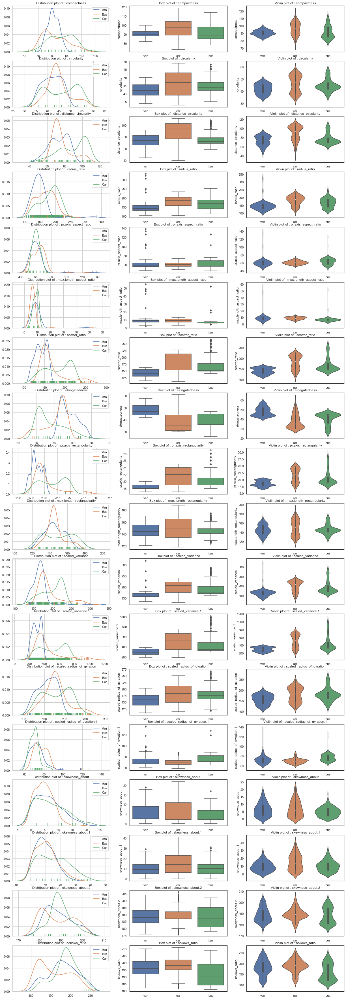

In [12]:
fig = plt.figure(1,(21,64))
c=0

data_van = data.loc[data['class']=='van']
data_car = data.loc[data['class']=='car']
data_bus = data.loc[data['class']=='bus']

for i,col in enumerate(data.columns[:-1]):
    c += 1
    sns.set(style='whitegrid')
    ax1 = plt.subplot(18,3,c)    
    sns.distplot(data_van[col],hist=False, rug=True,label='Van')
    sns.distplot(data_bus[col],hist=False, rug=True,label='Bus')
    sns.distplot(data_car[col],hist=False, rug=True,label='Car')    
    ax1.set_title('Distribution plot of : ' + col)
    ax1.set_xlabel(None)
    ax1.legend(loc="upper right")
    
    c+=1
    sns.set(style='white')
    ax2 = plt.subplot(18,3,c)  
    sns.boxplot(y=data[col], x=data['class'])
    ax2.set_title('Box plot of : ' + col)
    ax2.set_xlabel(None)
    
    c+=1
    sns.set(style='white')
    ax3 = plt.subplot(18,3,c)   
    sns.set(style='white')
    sns.violinplot(y=data[col], x=data['class'])
    ax3.set_title('Violin plot of : ' + col)
    ax3.set_xlabel(None)

##### Inisghts:
These plots could give us some idea about some segregation between clusters based upon min, median and max of each feature over class label. Some feature might be able to distinguish between all the 3 clusters but in some cases there could be an overlap

1. Compactness: Overall spread and median is highest for car and minimum for van for this variable. Median value is almost same for van and bus
2. Circularity: Median is highest for car and minimum for van. IQR is also max for car and smallest for bus. There are some outliers for this variable in bus
3. Distance circularity: Overall spread and IQR is highest for car and smallest for bus. Some outliers are present for bus in this variable. Median is again distiniguishable for car than other 2 clusters
4. Radius ratio: IQR and median are smallest for van and largest for car. bus has maximum value for this variable. Some outliers in van for this variable
5. Pr axis aspect ratio: median and IQR are almost the same for all clusters. cannot be distinguished. there are outliers in van and bus for this variable
6. max length aspect ratio:Data is overlapping for all clusters and cannot be distinguished. there are some outliers
7. scatter ratio: median and IQR is max for car followed by bus folloed by van. Clusters can be distinguished using this variable
8. elongatedness: Median is highest for van and lowest for car. data is overlapping beteween car and bus
9. pr axis rectangularity: median value and IQR is highest for car and lowest for van. data overlaps between car and bus.
10. max length rectangularity: Data overlaps for all 3 clusters and cannot be distinguished
11. scaled_variance: Overlap of data between car and bus. median is highest for car and lowest for van. Vans can be identified separately
12. scaled variance 1: Overlap of data between car and bus. median is highest for car and lowest for van. Vans can be identified separately
13. scaled radious of gyration: Data fairly overlaps and clusetrs cannot be distinguished
14. scaled radius of gyration 1: Data fairly overlaps and clusters cannot be distinguished
15. skewness about : Data fairly overlaps and clusters cannot be distinguished
16. skewness about 1 : Data fairly overlaps and clusters cannot be distinguished
17. skewness about 2 : Data fairly overlaps and clusters cannot be distinguished
18. Hollow ratios: Data fairly overlaps and clusters cannot be distinguished

### 1.2.4 Scatterplots between pair of numeric columns and hue = class

With scatter plots between variables we can try to understand which combination of variables clearly distinguish between clsuters

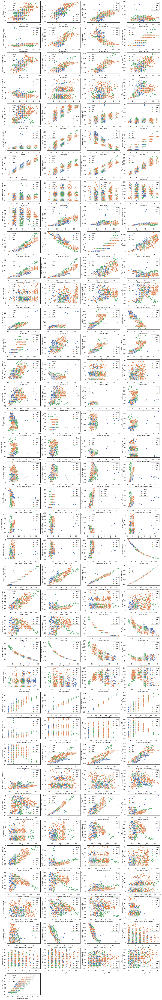

In [13]:
#col = df_scaled.columns[:-1]
col = list(data.columns[:-1])
combos = itertools.combinations(col,2)
counter=153
#for pair in combos:
#   counter+=1
#print(counter)

fig = plt.figure(1,figsize=(21,140))
ncol = 4
nrow = np.ceil(counter / ncol) 

for i,pair in enumerate(combos):
    sns.set(style='white')
    ax=plt.subplot(nrow,ncol,i+1)
    sns.scatterplot(x = pair[0], y =pair[1],data=data,hue=data['class'])


##### Insights:
1. There is no combination of 2 variables which clearly distinguishes between clusters clearly.
2. There is multicollinearity in features i.e many variables are positively related to each other ex. hollows ratio and skewness about 2, scaled variance and scaled variance 1 and many other.
3. We will take care of multocolinearity in later steps

## 1.3 Data Preprocessing

In this section we will detect the outliers and impute the outliers with central values. This could change the distribution of the variable, however since there are not lot of outliers in the dataset, impact will be too less.

#### 1.3.1 Handling Outliers

##### 1.3.1.1 Detecting and Quantifying outliers 

In [14]:
def handle_outlier(x):
    IQR = data[x].quantile(0.75) - data[x].quantile(0.25)
    min_range = data[x].quantile(0.25) - 1.5*IQR
    max_range = data[x].quantile(0.75) + 1.5*IQR
    outliers = data[(data[x] < min_range) | (data[x] > max_range)]
    return outliers
  

In [15]:
df_outlier = pd.DataFrame()
list_dict = []
for feature in data.columns[:-1]:
    df = handle_outlier(feature)
    x = {'Feature name': feature,
        'Total count': data[feature].count(),
         'Outlier Count': len(df),
         '% Outliers': (len(df)/len(data)*100),
         'min_outlier': df[feature].min(),
         'max_outlier': df[feature].max()
        }
    list_dict.append(x)

df_outlier = df_outlier.append(list_dict, True)
print('Outlier analysis on numerical variables')
df_outlier

Outlier analysis on numerical variables


,Feature name,Total count,Outlier Count,% Outliers,min_outlier,max_outlier
0,compactness,813,0,0.000000,NaN,NaN
1,circularity,813,0,0.000000,NaN,NaN
2,distance_circularity,813,0,0.000000,NaN,NaN
3,radius_ratio,813,3,0.369004,306.0,333.0
4,pr.axis_aspect_ratio,813,8,0.984010,97.0,138.0
5,max.length_aspect_ratio,813,13,1.599016,2.0,55.0
6,scatter_ratio,813,0,0.000000,NaN,NaN
7,elongatedness,813,0,0.000000,NaN,NaN
8,pr.axis_rectangularity,813,0,0.000000,NaN,NaN
9,max.length_rectangularity,813,0,0.000000,NaN,NaN


##### Pending Insights
1. There are very less number of outliers overall
2. Maximum outlier in any column are 1.8% which is very low

##### 1.3.1.2 Imputing Outliers 

In below steps we will impute the outliers with median values

In [16]:
data_copy = data.copy()
for feature in data.columns[:-1]:
    df = handle_outlier(feature)
    lst_replace = list(np.array(df[feature]))
    data[feature] = data[feature].replace(lst_replace,data[feature].median())



In [17]:
# Rechecking presence of outliers in all variables
df_outlier = pd.DataFrame()
list_dict = []
for feature in data.columns[:-1]:
    df = handle_outlier(feature)
    x = {'Feature name': feature,
        'Total count': data[feature].count(),
         'Outlier Count': len(df),
         '% Outliers': (len(df)/len(data)*100),
         'min_outlier': df[feature].min(),
         'max_outlier': df[feature].max()
        }
    list_dict.append(x)

df_outlier = df_outlier.append(list_dict, True)
print('Outlier analysis on numerical variables')
df_outlier

Outlier analysis on numerical variables


,Feature name,Total count,Outlier Count,% Outliers,min_outlier,max_outlier
0,compactness,813,0,0.0,NaN,NaN
1,circularity,813,0,0.0,NaN,NaN
2,distance_circularity,813,0,0.0,NaN,NaN
3,radius_ratio,813,0,0.0,NaN,NaN
4,pr.axis_aspect_ratio,813,0,0.0,NaN,NaN
5,max.length_aspect_ratio,813,0,0.0,NaN,NaN
6,scatter_ratio,813,0,0.0,NaN,NaN
7,elongatedness,813,0,0.0,NaN,NaN
8,pr.axis_rectangularity,813,0,0.0,NaN,NaN
9,max.length_rectangularity,813,0,0.0,NaN,NaN


### 1.3.2 Data Scaling

As all the variables have values on different scales it will becomes important to scale the data. We will use StandardScaler to scale


#### Box Plot - Before Scaling

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 <a list of 18 Text major ticklabel objects>)

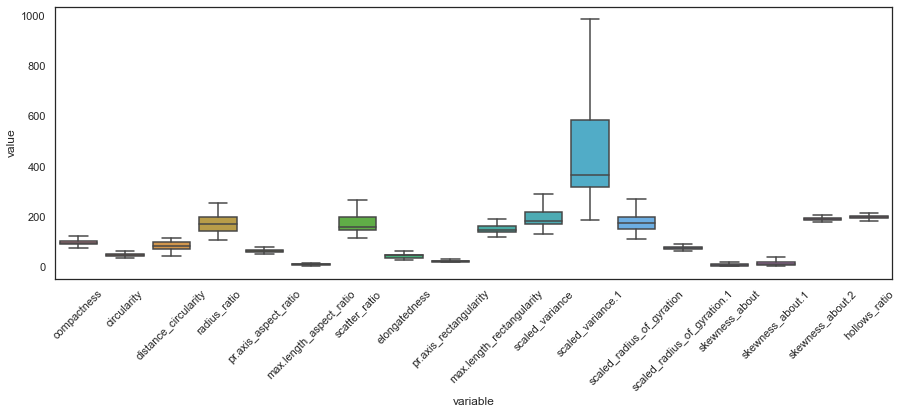

In [18]:
fig = plt.figure(1, (15, 5))
ax = plt.subplot(1,1,1)
sns.boxplot(x="variable",y="value", data=pd.melt(data[data.columns[:-1]]))
plt.xticks(rotation=45)

All the variables are on very different scales and ranges of values in each variable differs considerably.
Hence it will be wise to scale the data and then plot the boxplot to visualise

#### Scaling Data using StandardScaler

In [19]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
df_scaled =data.copy()

col_names = data.columns[:-1]

col_to_scale = data[col_names]

col_to_scale = sc.fit_transform(col_to_scale.values)

df_scaled[col_names] = col_to_scale

df_scaled.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,0.163231,0.520408,0.060669,0.293086,1.910784,0.901660,-0.198517,0.129648,-0.217151,0.766312,-0.396188,-0.334286,0.301676,-0.306637,-0.028229,0.390095,-0.321809,0.171837,van
1,-0.322874,-0.619123,0.124067,-0.852337,-0.750782,0.419073,-0.591720,0.514333,-0.606014,-0.337462,-0.590968,-0.617686,-0.502972,0.021168,0.627492,0.161932,0.003400,0.442318,van
2,1.256966,0.845988,1.518823,1.252765,0.846157,0.901660,1.162569,-1.152637,0.949438,0.697326,1.129588,1.146334,1.415804,0.185071,1.720362,-0.408478,-0.159204,0.036596,car
3,-0.079822,-0.619123,-0.002729,-0.295104,0.313844,0.419073,-0.742952,0.642562,-0.606014,-0.337462,-0.915602,-0.739143,-1.462359,-1.453956,-0.028229,-0.294396,1.629444,1.524243,van
4,-1.052030,-0.130753,-0.763506,1.128936,-0.041031,-0.063514,-0.591720,0.514333,-0.606014,-0.268476,1.713928,-0.646605,0.425468,-0.142734,0.627492,-0.180314,-1.460039,-1.721531,bus


#### Box Plot - After Scaling

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 <a list of 18 Text major ticklabel objects>)

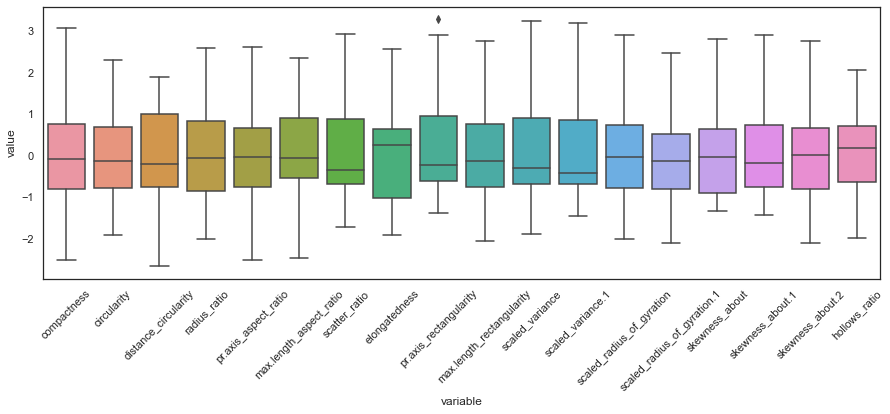

In [20]:
fig = plt.figure(1, (15, 5))
ax = plt.subplot(1,1,1)
sns.boxplot(x="variable",y="value", data=pd.melt(df_scaled[df_scaled.columns[:-1]]))
plt.xticks(rotation=45)

#### Box Plot - Hue over variable 'Class'

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001DA720E8390>,
      dtype=object)

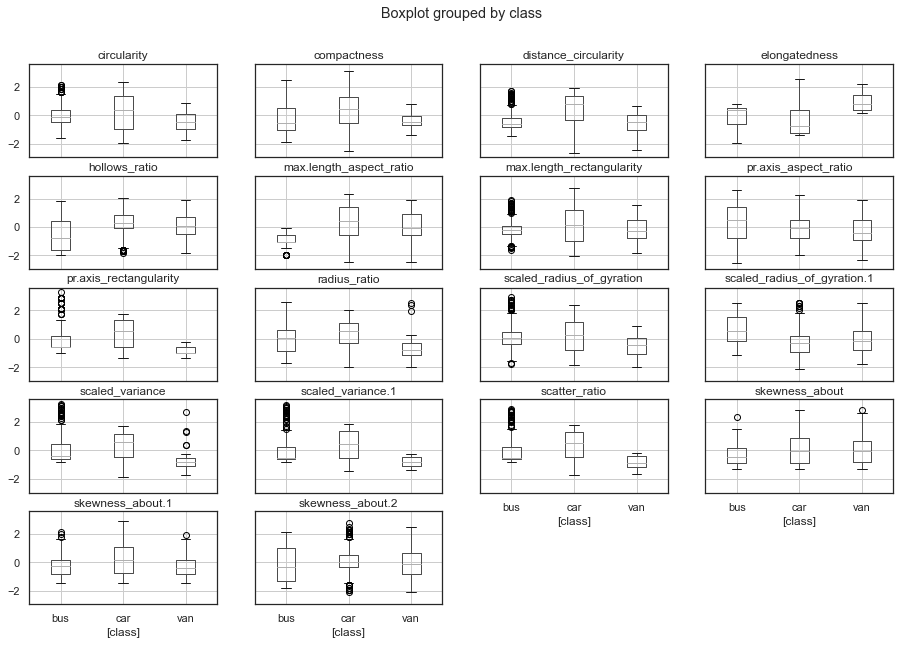

In [21]:
df_scaled.boxplot(by='class', layout = (5,4),figsize=(15,10))

There is no variable which can clearly distinguish between clusters and there is  fair amount of overlap in data in variables

## <a id='data'>2. Understanding and Finalisation of Attributes<a>

In this section we will try to understand relationship between different attributes. If there are attributes which are highly correltaed to each other, we shall make a decision to keep only one of them.

## 2.1 Pair Plot to check relationship between numeric variables

<Figure size 1512x1440 with 0 Axes>

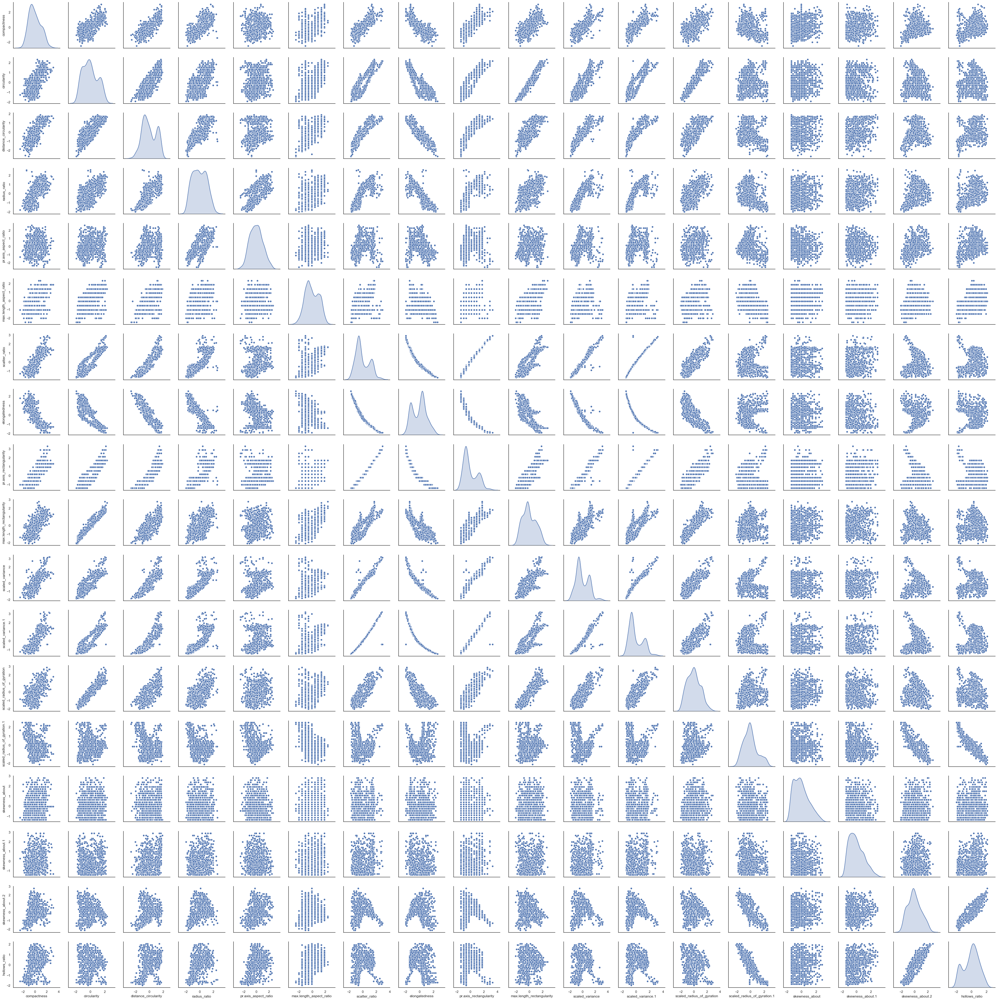

In [22]:
#bivariate analysis
fig = plt.figure(1,figsize=(21,20))
sns.pairplot(df_scaled,diag_kind='kde')

We can see that some variables have direct positive or negative correlation among them. We will Analyse these combinations separately in later sections

## 2.2 Correlation Matrix
Correlation matrix will quantify degree of correlation between numeric variables

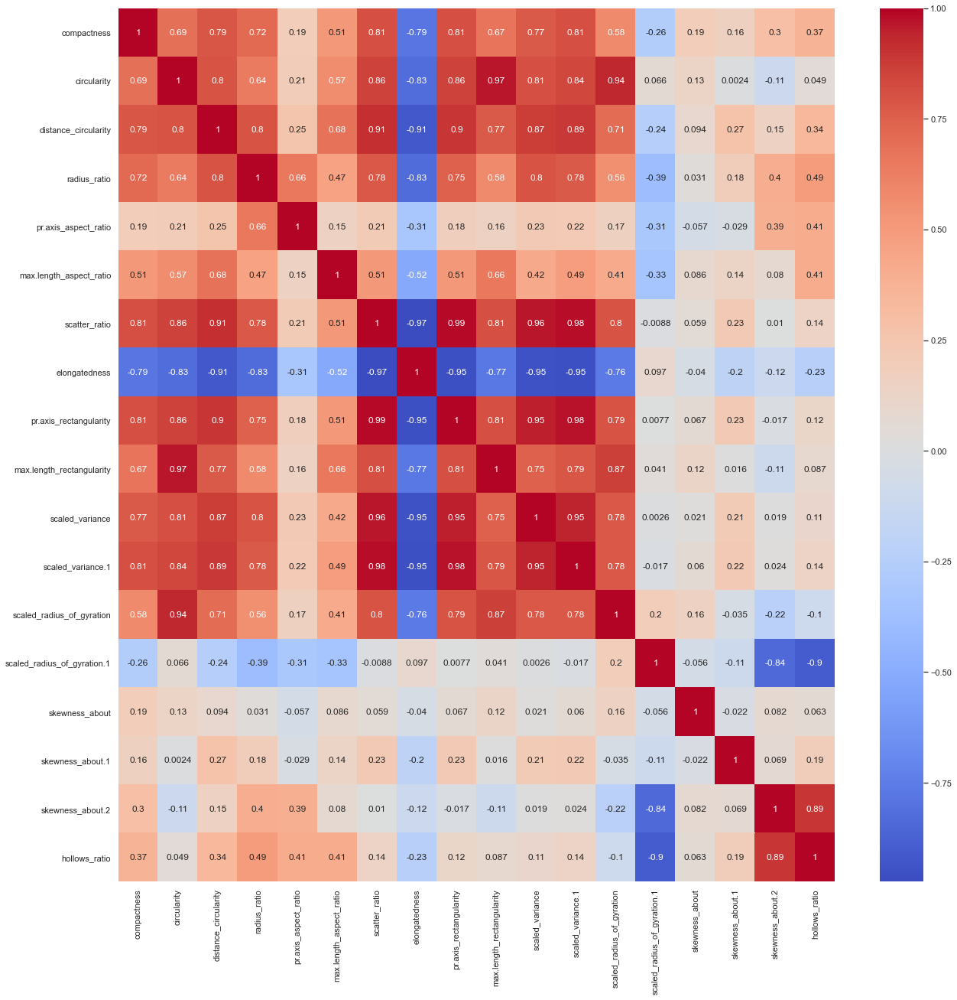

In [23]:
corrMatrix = df_scaled.corr()
fig = plt.figure(1,figsize=(21,21))
sns.heatmap(corrMatrix,annot=True,cmap='coolwarm')

##### Comments:
1. From pairplot and correlation heatmap - there are multicollinear features in the dataset.
2. There are many features which are highly correlated with each other
3. We will create pairs of all the variables and compare the correlation coefficient of these combinations with a threshold
4. We will define threshold to be 0.7 i.e any combination of the features with correlation coefficient value greater than the threshold, one of those features shall be dropped


#### # Variable pairs with correlation coefficient >  0.7

In [24]:
col = df_scaled.columns[:-1]
col = list(col)
combos = itertools.combinations(col,2)
lstCorrPair = []
# Lets assume a correlation value threshold beyond which we will assume that attributes are highly correlated and can be dropped
th = 0.8
for pair in combos:
    if (corrMatrix[pair[0]][pair[1]] > th) | (corrMatrix[pair[0]][pair[1]] < -th) :
        lstCorrPair.append(pair+(corrMatrix[pair[0]][pair[1]],))

print('There are total {} combinations which have correlation coefficient > 0.7. Following is the list of the same'.format(len(lstCorrPair)))


df_corr_features = pd.DataFrame(lstCorrPair,columns=['Column1','Column2','Correlation Coefficient'])
df_corr_features


There are total 32 combinations which have correlation coefficient > 0.7. Following is the list of the same


,Column1,Column2,Correlation Coefficient
0,compactness,scatter_ratio,0.814026
1,compactness,pr.axis_rectangularity,0.814227
2,compactness,scaled_variance.1,0.812207
3,circularity,scatter_ratio,0.858149
4,circularity,elongatedness,-0.825108
5,circularity,pr.axis_rectangularity,0.856137
6,circularity,max.length_rectangularity,0.965366
7,circularity,scaled_variance,0.813063
8,circularity,scaled_variance.1,0.842380
9,circularity,scaled_radius_of_gyration,0.935594


### 2.2.1 Dropping features with high multicollinearity

In [25]:
col_to_drop = list(df_corr_features['Column2'].unique())
print("Dropped Features: {}".format(len(col_to_drop)))
col_to_drop

Dropped Features: 9


['scatter_ratio',
 'pr.axis_rectangularity',
 'scaled_variance.1',
 'elongatedness',
 'max.length_rectangularity',
 'scaled_variance',
 'scaled_radius_of_gyration',
 'skewness_about.2',
 'hollows_ratio']

#### # Relevant Features List

In [26]:
col = list(data.columns[:-1])
sel_features = []


for c in col_to_drop:
    if c in col:
        col.remove(c)
print("Relevant Features: {}".format(len(col)))
col

Relevant Features: 9


['compactness',
 'circularity',
 'distance_circularity',
 'radius_ratio',
 'pr.axis_aspect_ratio',
 'max.length_aspect_ratio',
 'scaled_radius_of_gyration.1',
 'skewness_about',
 'skewness_about.1']

#### # Dataset with Relevant Features

In [27]:
# prepare dataset with only relevant features
data_relevant_feature = df_scaled.drop(col_to_drop,axis=1)
data_relevant_feature

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,class
0,0.163231,0.520408,0.060669,0.293086,1.910784,0.901660,-0.306637,-0.028229,0.390095,van
1,-0.322874,-0.619123,0.124067,-0.852337,-0.750782,0.419073,0.021168,0.627492,0.161932,van
2,1.256966,0.845988,1.518823,1.252765,0.846157,0.901660,0.185071,1.720362,-0.408478,car
3,-0.079822,-0.619123,-0.002729,-0.295104,0.313844,0.419073,-1.453956,-0.028229,-0.294396,van
4,-1.052030,-0.130753,-0.763506,1.128936,-0.041031,-0.063514,-0.142734,0.627492,-0.180314,bus
...,...,...,...,...,...,...,...,...,...,...
841,-0.079822,-0.944703,0.314261,0.447873,0.491282,-0.063514,0.021168,0.190345,1.416832,car
842,-0.565926,0.194828,0.124067,-0.171275,0.846157,1.384247,0.021168,-1.121098,0.846423,van
843,1.500018,1.497149,1.201833,1.655211,1.023595,1.866833,-0.306637,-0.683951,-0.978887,car
844,-0.930504,-1.433074,-0.256321,-0.697550,-0.573344,-0.546101,-0.962248,-1.339672,1.416832,car


### 2.2.2 Rechecking correlation among relevant features

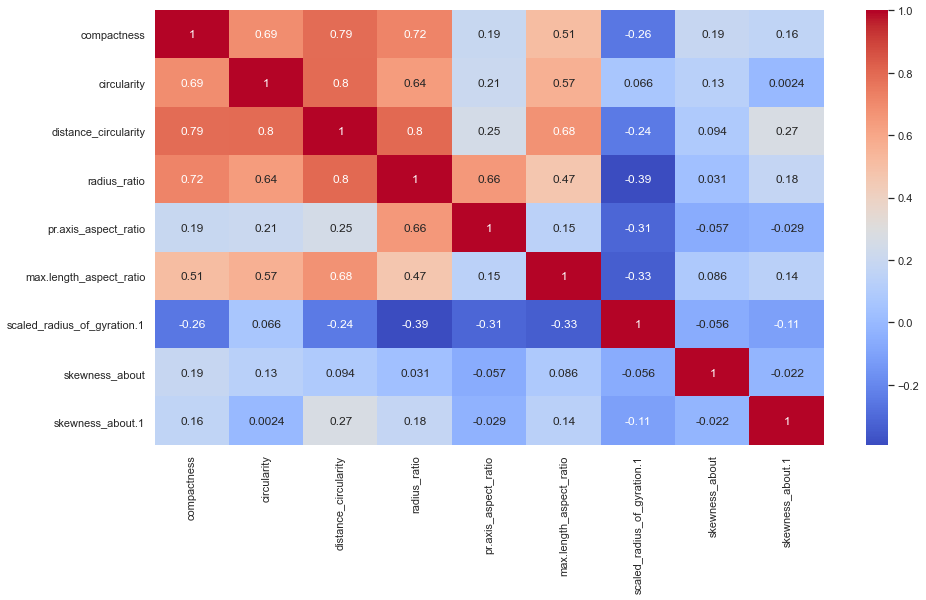

In [28]:
fig = plt.figure(1,figsize=(15,8))
sns.heatmap(data_relevant_feature.corr(),annot=True,cmap='coolwarm')

##### Insights
1. There are no features which have correlation coefficient greater than 0.7 for any combination
2. Feature elingatedness is negatively correlated with compactness and circularity
3. Feature skewness_about.2 is negatively correlated with 'scaled_radius_of_gyration.1'

## <a id='split'>3. Splitting dataset in train and test dataset<a>

In [29]:
from sklearn.model_selection import train_test_split
X = df_scaled.drop('class',axis=1)
y = df_scaled['class']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25,random_state=1)

## <a id='simplesvm'>4. Building basic support vector machine classifier<a>

### 4.1 SVM classifier with original scaled dataset

In [30]:
df = pd.DataFrame()
def build_comp_df(classifier,testaccuracy,trainaccuracy, precision, recall, f1score):
    global df
    compDict = {'Algorithm':classifier,
               'Clf Accuracy Test': testaccuracy,
                'Clf Accuracy Train': trainaccuracy,
               'Clf Precision': precision,
               'Clf Recall': recall,
               'Clf f1 Score': f1score}
    df = df.append(compDict,ignore_index=True)
    return df
    

In [31]:

from sklearn.svm import SVC
base_svc = SVC()
base_svc.fit(X_train,y_train)
print("Training Accuracy : {}".format(base_svc.score(X_train,y_train)))
print("Testing Accuracy : {}".format(base_svc.score(X_test,y_test)))

testaccuracy = accuracy_score(y_test,base_svc.predict(X_test))
trainaccuracy = accuracy_score(y_train,base_svc.predict(X_train))
precision = precision_score(y_test,base_svc.predict(X_test),average='macro')
recall = recall_score(y_test,base_svc.predict(X_test),average='macro')
f1score = f1_score(y_test,base_svc.predict(X_test),average='macro')

df1 = build_comp_df('Basic SVC',testaccuracy,trainaccuracy,precision,recall,f1score)


Training Accuracy : 0.9737274220032841
Testing Accuracy : 0.9558823529411765


##### Insights:
1. Test and train accuracies are quite high and same. indicating that there is no overfitting. 
2. Precision and recall scores are also very high

### 4.2 SVM classifier after feature selection

###### Selected Features:
'compactness',
 'circularity',
 'distance_circularity',
 'radius_ratio',
 'pr.axis_aspect_ratio',
 'max.length_aspect_ratio',
 'scaled_radius_of_gyration.1',
 'skewness_about',
 'skewness_about.1'

We will rebuild basic SVM using the seelcted features only to see the impact of 50 % reduction of number of variables i.e only 9 variables instead of original 18
 

In [32]:
X_rel = data_relevant_feature.drop('class',axis=1)
y_rel = data_relevant_feature['class']
X_train1,X_test1,y_train1,y_test1 = train_test_split(X_rel,y_rel,test_size=0.25,random_state=1)
base_svc1 = SVC()
base_svc1.fit(X_train1,y_train1)

print("Training Accuracy : {}".format(base_svc1.score(X_train1,y_train1)))
print("Testing Accuracy : {}".format(base_svc1.score(X_test1,y_test1)))

testaccuracy = accuracy_score(y_test,base_svc1.predict(X_test1))
trainaccuracy = accuracy_score(y_train,base_svc1.predict(X_train1))
precision = precision_score(y_test,base_svc1.predict(X_test1),average='macro')
recall = recall_score(y_test,base_svc1.predict(X_test1),average='macro')
f1score = f1_score(y_test,base_svc1.predict(X_test1),average='macro')

df1 = build_comp_df('SVC - Selected Features(9)',testaccuracy,trainaccuracy,precision,recall,f1score)


Training Accuracy : 0.9359605911330049
Testing Accuracy : 0.8970588235294118


#####  Insights
1. it is visible that after dropping following features there is  aprrox 10% drop in accuracy on test set
'scatter_ratio',
 'pr.axis_rectangularity',
 'scaled_variance.1',
 'elongatedness',
 'max.length_rectangularity',
 'scaled_variance',
 'scaled_radius_of_gyration',
 'skewness_about.2',
 'hollows_ratio'

2. We have reduced the dimensions from 18 to 9 i.e 50% reduction and have managed to get a good accuracy score (just 6% less than the accuracy of model with 18 dimensions

## <a id='svmcv'>5. SVM cross validation <a>

This will be trained only on original scaled dataset and not on the selected features dataset

## 5.1 SVM with GridSearchCV

In [33]:
classifier = SVC()

#defining hyperparameter C and lambda
paramC = [0.1,1,10,100,1000]
paramGamma = [1,0.1,0.01,0.001,0.0001]
paramKernel = ['rbf']
hyperparameter =  {'C': paramC,  
              'gamma': paramGamma, 
              'kernel': paramKernel} 
cvSVC = GridSearchCV(classifier, hyperparameter,n_jobs=-1)

cvSVC.fit(X_train,y_train)

GridSearchCV(cv=None, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [34]:
cvSVC.best_params_

{'C': 100, 'gamma': 0.01, 'kernel': 'rbf'}

After Grid search validation optimal value of hyperparameters

In [35]:
print("Training Accuracy : {}".format(accuracy_score(y_train,cvSVC.predict(X_train))))
print("Testing Accuracy : {}".format(accuracy_score(y_test,cvSVC.predict(X_test))))

testaccuracy = accuracy_score(y_test,cvSVC.predict(X_test))
trainaccuracy = accuracy_score(y_train,cvSVC.predict(X_train))
precision = precision_score(y_test,cvSVC.predict(X_test),average='macro')
recall = recall_score(y_test,cvSVC.predict(X_test),average='macro')
f1score = f1_score(y_test,cvSVC.predict(X_test),average='macro')

df1 = build_comp_df('SVC- Grid Search',testaccuracy,trainaccuracy,precision,recall,f1score)


Training Accuracy : 0.9967159277504105
Testing Accuracy : 0.9705882352941176


##### Insights:
1. There is a slight improvement in train and test accuracies
2. precision and recall scores have also improved marginally

## 5.2 SVM with K-fold Cross validation

In [36]:

from sklearn.model_selection import cross_val_score
kfSVC = SVC()
trainScores = cross_val_score(kfSVC, X_train,y_train, cv=10)
testScore = cross_val_score(kfSVC, X_test,y_test,cv=10)
print("Train Scores: ")
print(trainScores)
print("-"*60)
print("Test Scores: ")
print(testScore)


Train Scores: 
[0.96721311 0.95081967 0.91803279 0.98360656 1.         0.98360656
 0.95081967 0.91803279 0.96721311 0.91666667]
------------------------------------------------------------
Test Scores: 
[0.95238095 0.95238095 0.9047619  0.85714286 0.95       1.
 0.9        1.         0.85       0.85      ]


In [37]:
print("K-Fold cross validation mean score on Training dataset : {}".format(trainScores.mean()))
print("K-Fold cross validation mean score on Test dataset : {}".format(testScore.mean()))

testaccuracy = testScore.mean()
trainaccuracy = trainScores.mean()
precision = 'NA'
recall = 'NA'
f1score = 'NA'

df1 = build_comp_df('SVC- K-Fold',testaccuracy,trainaccuracy,precision,recall,f1score)


K-Fold cross validation mean score on Training dataset : 0.9556010928961747
K-Fold cross validation mean score on Test dataset : 0.9216666666666665


##### Insights:

There is a slight drop in train and test accuracies compared to other algorithms. This can be more reliable as K Fold over all reduces the chances of overfitting

## <a id='pca'>6. Principal Component Analysis<a>

### 6.1 Building PCA

In [38]:

from sklearn.decomposition import PCA
pca = PCA()
pca.fit(X)
explained_variance = pca.explained_variance_
explained_variance


array([9.82115454e+00, 3.30822663e+00, 1.17963517e+00, 1.15077799e+00,
       8.76739839e-01, 6.60591503e-01, 3.21967390e-01, 2.30083911e-01,
       1.30554075e-01, 8.06345168e-02, 7.00562768e-02, 6.23135927e-02,
       3.82321443e-02, 2.89721413e-02, 2.65237362e-02, 1.99450705e-02,
       1.27515951e-02, 3.00736189e-03])

#### 6.1.1 Principal components

In below section we will plot explained variance vs feature and choose the number of features which explains 95% variance in the data

Text(0.5, 1.0, 'PCA cummulative Explained variance vs features')

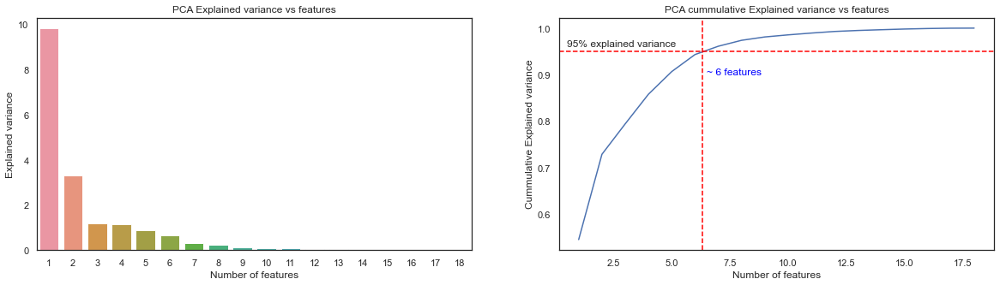

In [39]:
fig, (ax1,ax2) = plt.subplots(1,2,figsize=(20,5))
x = np.arange(1,19)
y1 = explained_variance
sns.barplot(x,y1,ax=ax1)
ax1.set_xlabel('Number of features')
ax1.set_ylabel('Explained variance')
ax1.set_title('PCA Explained variance vs features')

sns.set(style='whitegrid')
sns.lineplot(x,np.cumsum(pca.explained_variance_ratio_),ax=ax2)
ax2.axhline(0.95, ls='--',c='red')
ax2.text(0.5,0.96,'95% explained variance')
ax2.axvline(6.3, ls='--',c='red')
ax2.text(6.5,0.9,'~ 6 features',c='blue')

ax2.set_xlabel('Number of features')
ax2.set_ylabel('Cummulative Explained variance')
ax2.set_title('PCA cummulative Explained variance vs features')

In [40]:
pca.explained_variance_

array([9.82115454e+00, 3.30822663e+00, 1.17963517e+00, 1.15077799e+00,
       8.76739839e-01, 6.60591503e-01, 3.21967390e-01, 2.30083911e-01,
       1.30554075e-01, 8.06345168e-02, 7.00562768e-02, 6.23135927e-02,
       3.82321443e-02, 2.89721413e-02, 2.65237362e-02, 1.99450705e-02,
       1.27515951e-02, 3.00736189e-03])

In [41]:
df_comp = pd.DataFrame(pca.components_,columns=X.columns,index = list(np.arange(1,19)))
df_comp

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
1,0.271365,0.287377,0.301829,0.270661,0.101396,0.199181,0.309818,-0.307768,0.306652,0.276288,0.299423,0.305739,0.261331,-0.047914,0.034007,0.062835,0.038738,0.089770
2,-0.085112,0.142304,-0.043793,-0.191957,-0.249230,-0.098033,0.074149,-0.012309,0.087738,0.127239,0.074756,0.067516,0.211940,0.504716,-0.015677,-0.080818,-0.507893,-0.507878
3,-0.041988,-0.201979,0.058442,0.071763,-0.035272,-0.181708,0.109612,-0.098433,0.105546,-0.224435,0.148346,0.112310,-0.202389,0.082719,-0.560423,0.655557,-0.051041,-0.050406
4,0.140206,-0.045569,0.108618,-0.249836,-0.612708,0.260690,0.009280,0.061009,0.036780,0.029135,-0.056973,0.003814,-0.093910,-0.110518,0.459311,0.458660,-0.023507,0.092127
5,0.106457,-0.110072,-0.081297,0.153919,0.197544,-0.596794,0.070512,-0.070664,0.061299,-0.235854,0.129054,0.089796,0.011560,0.155602,0.609061,0.157845,0.149056,-0.120670
6,0.289598,-0.068136,-0.032055,-0.118959,-0.561050,-0.360567,0.110594,-0.085210,0.117662,-0.107873,0.148222,0.123273,-0.073537,-0.109103,-0.249752,-0.456392,0.283462,0.032494
7,0.216453,-0.377659,0.153908,0.157163,0.099892,0.399191,0.091763,-0.103946,0.090885,-0.348930,0.068423,0.085995,-0.470964,0.095033,0.128670,-0.293705,-0.258785,-0.175671
8,-0.741058,-0.069573,0.277252,0.119962,-0.195239,-0.045587,0.067121,-0.192017,0.022453,-0.230460,0.198083,0.027228,0.140517,-0.342475,0.116180,-0.126273,-0.112834,-0.018931
9,0.384502,0.037239,0.081570,0.262076,-0.025132,-0.122830,-0.151056,0.303654,-0.104432,-0.146678,0.044508,-0.135452,0.268066,-0.543362,-0.063664,0.061462,-0.360131,-0.295493
10,-0.154098,0.174007,-0.197755,0.044642,0.046907,-0.209697,0.121218,0.103599,0.231205,0.419284,-0.167450,0.268783,-0.562485,-0.358439,0.058220,-0.009703,-0.192912,-0.134798


#####  Insights:
Important:
6 Fetures explains 95% of the variance in data. this is stark 66% reduction in number of variables

We will rebuild PCA with 6 principal components and then train SVM classifier again

## 6.2 SVM with Principal Components only

In [42]:
newPca = PCA(n_components=6)
X_new = newPca.fit_transform(X)

X_train2, X_test2, y_train2, y_test2 = train_test_split(X_new, y, test_size=0.25, random_state=1)

In [43]:
pcaSvm = SVC()
pcaSvm.fit(X_train2,y_train2)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [44]:
print("Accuracy Training dataset post PCA : {}".format(accuracy_score(y_train2,pcaSvm.predict(X_train2))))
print("Accuracy Test dataset post PCA : {}".format(accuracy_score(y_test2,pcaSvm.predict(X_test2))))

testaccuracy = accuracy_score(y_test2,pcaSvm.predict(X_test2))
trainaccuracy = accuracy_score(y_train2,pcaSvm.predict(X_train2))
precision = precision_score(y_test2,pcaSvm.predict(X_test2),average='macro')
recall = recall_score(y_test2,pcaSvm.predict(X_test2),average='macro')
f1score = f1_score(y_test2,pcaSvm.predict(X_test2),average='macro')

df1 = build_comp_df('SVC- PCA (6)',testaccuracy,trainaccuracy,precision,recall,f1score)


Accuracy Training dataset post PCA : 0.9326765188834154
Accuracy Test dataset post PCA : 0.8823529411764706


## <a id='modeleval'>7. Model Comparison<a>

In [45]:
df1

,Algorithm,Clf Accuracy Test,Clf Accuracy Train,Clf Precision,Clf Recall,Clf f1 Score
0,Basic SVC,0.955882,0.973727,0.952072,0.955373,0.953525
1,SVC - Selected Features(9),0.897059,0.935961,0.882024,0.902049,0.890991
2,SVC- Grid Search,0.970588,0.996716,0.969082,0.968745,0.968832
3,SVC- K-Fold,0.921667,0.955601,NA,NA,NA
4,SVC- PCA (6),0.882353,0.932677,0.86159,0.898031,0.875296


## Conclusions:

1. Best accuracy precision and recall scores are when SVC is built using Grid search CV and C = 100 and gamma =0.01
2. There is just 8% reduction in accuracy on test set when we train the model with 6 principal components compared with SVC with Grid search. On a larger dataset this would mean a huge reduction in time and space complexity in run time.
3. There is just 4% reduction in accuracy when using PCA and training model using 6 principal components compared with  SVM build using K Fold CV.